# Detección de figuras de ajedrez con YOLO_V5

El objetivo de este notebook es utilzar las redes YOLO, en concreto YOLO_V5 para la detección de objetos en las imagenes. En eset caso utilizamos un datset de fichas de ajedrez, de uso libre y que hemos etiquetada en Roboflow.

## Paso 1: Instalamos los requerimientos. Nos bajamos el repo de ultralytics donde esta codificado el proyecto de YOLOV5

In [1]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 9945, done.
remote: Counting objects: 100% (22/22), done.
remote: Compressing objects: 100% (22/22), done.
remote: Total 9945 (delta 8), reused 0 (delta 0), pack-reused 9923
Receiving objects: 100% (9945/9945), 10.28 MiB | 18.21 MiB/s, done.
Resolving deltas: 100% (6883/6883), done.
/content/yolov5
     |████████████████████████████████| 596 kB 5.5 MB/s 
     |████████████████████████████████| 178 kB 5.2 MB/s 
     |████████████████████████████████| 1.1 MB 36.5 MB/s 
     |████████████████████████████████| 138 kB 44.8 MB/s 
     |████████████████████████████████| 62 kB 765 kB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.26.0 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompati

# Paso 2- Cargamos el dataset de Roboflow.

In [2]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [3]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"


In [4]:
#after following the link above, recieve python code with these fields filled in
#from roboflow import Roboflow
#rf = Roboflow(api_key="YOUR API KEY HERE")
#project = rf.workspace().project("YOUR PROJECT")
#dataset = project.version("YOUR VERSION").download("yolov5")

#  Previamante este dataset ha tenido que estar etiquetado.
# Cargamosmos un dataset de ajedrez que estaba casi etiquetado. He tenido que etiquetar alguna imagen.
# from roboflow import Roboflow
# rf = Roboflow(api_key="U1H0bdhEKd1ABXsbf3au")
# project = rf.workspace().project("chess-sample-kcdly")
# dataset = project.version(1).download("yolov5")

from roboflow import Roboflow
rf = Roboflow(api_key="U1H0bdhEKd1ABXsbf3au")
project = rf.workspace().project("hard-hat-sample-sa1dv")
dataset = project.version(2).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/Hard-Hat-Sample-2 in yolov5pytorch:: 100%|██████████| 491/491 [00:00<00:00, 1028.09it/s]


In [5]:
#Roboflow hace el trabajo por nosotros y nos escribe el taml de configuración de los datos. Tiene este aspecto
%cat {dataset.location}/data.yaml

names:
- head
- helmet
- person
nc: 3
train: /content/datasets/Hard-Hat-Sample-2/train/images
val: /content/datasets/Hard-Hat-Sample-2/valid/images


# Paso 4 : Entrenamos el modelo YOLOv5

Los parámetros a informar:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [6]:
!python train.py --img 416 --batch 16 --epochs 150 --data {dataset.location}/data.yaml --weights yolov5s.pt  --cache

train: weights=yolov5s.pt, cfg=, data=/content/datasets/Hard-Hat-Sample-2/data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=150, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-62-g5f603a9 torch 1.9.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0

# Paso 5: Visualizamos las métricas con el board d tensorflow.


In [7]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

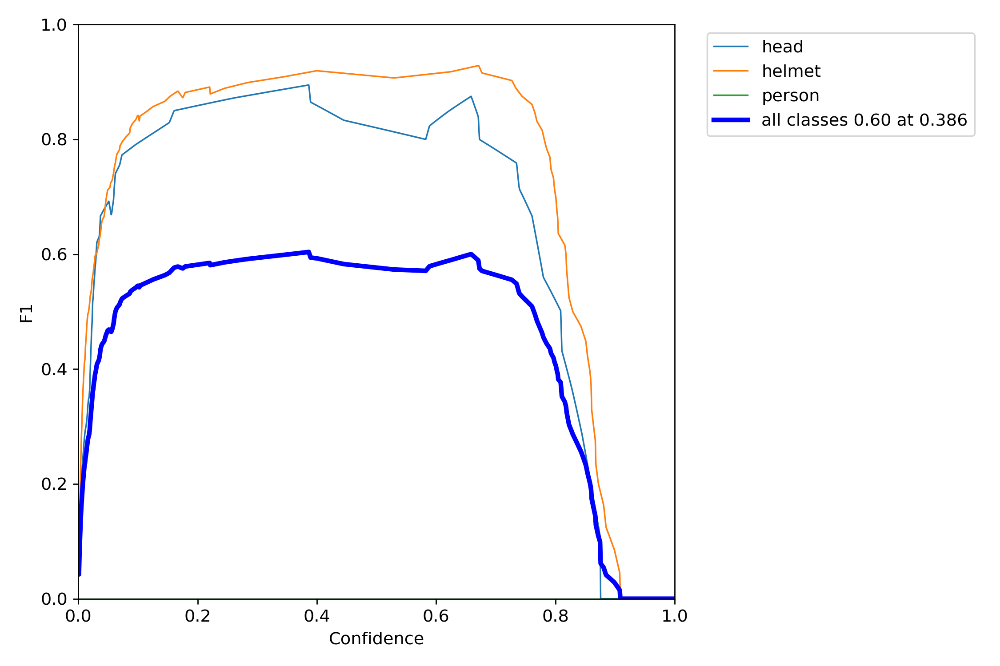

In [9]:
# Otra forma mas tradicional ver los resultados que nos genera el propio modelo al ejecutarse
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/exp/F1_curve.png', width=500)  # view results.png

# Paso 6: Hacemos validación con la parte de test


In [12]:
print({dataset.location})

{'/content/datasets/Hard-Hat-Sample-2'}


In [17]:
%ls /content/datasets/Hard-Hat-Sample-2/test/images

000008_jpg.rf.uUvdAuyxqNzwOtuKS9rD.jpg  000073_jpg.rf.bmKCJq3Kzms3mRe3UhaE.jpg
000011_jpg.rf.AzPZGNalgq6aqqbRAE1e.jpg  000076_jpg.rf.WAbbqjsWPoQLAOa5E5E7.jpg
000034_jpg.rf.axFTqzpEMpjrYI3h3dLa.jpg  000084_jpg.rf.fw2vg5IsGC3GNMIajL20.jpg
000047_jpg.rf.gNjrUJ31GZ1Vql631z17.jpg  000097_jpg.rf.QZsflUPdzfRTQTgueHgi.jpg
000054_jpg.rf.2qvS2kxJSQUweBSH9SQY.jpg  000098_jpg.rf.7KNQzp1xL5SfUeVW4y8L.jpg


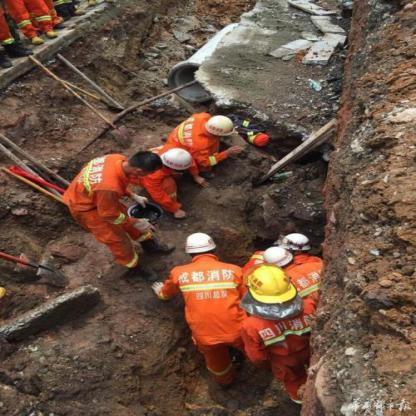

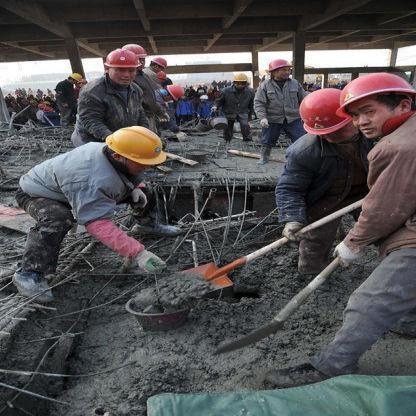

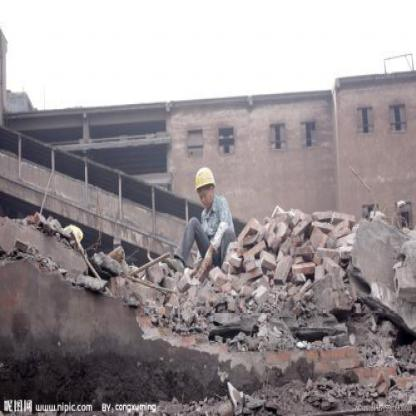

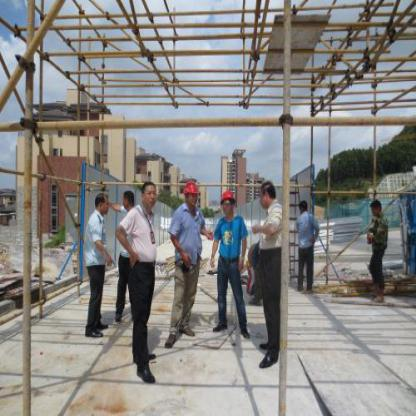

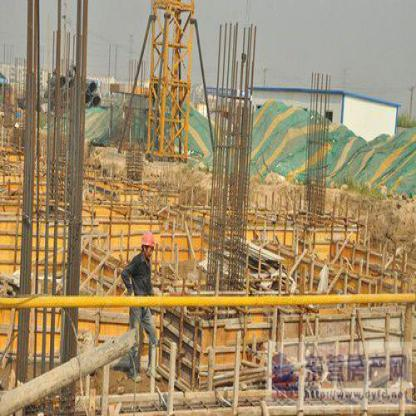

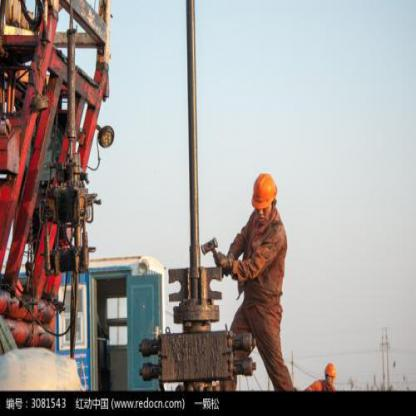

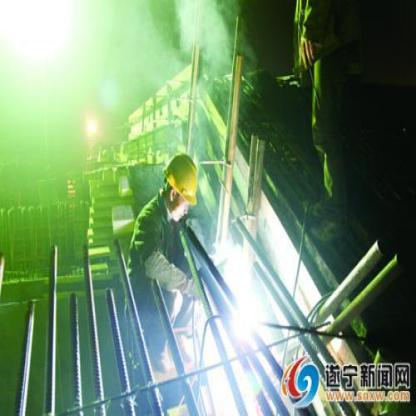

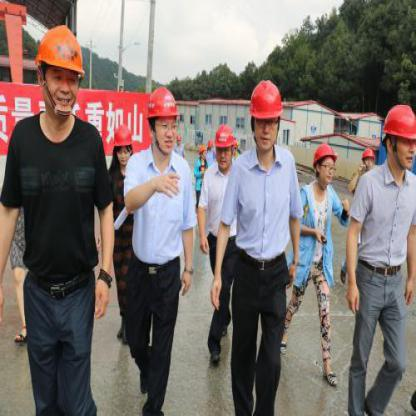

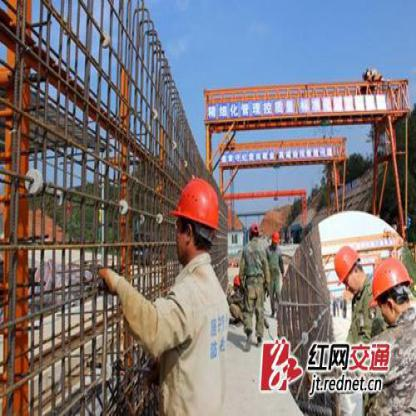

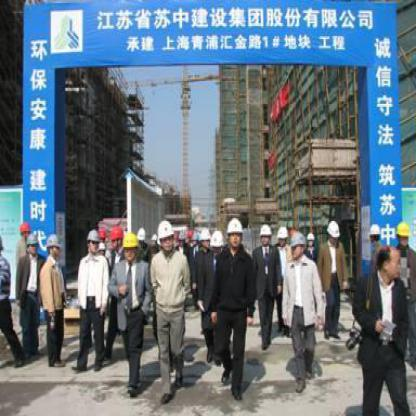

In [18]:
#Nuestras imagenes de test es la siguiente
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/datasets/Hard-Hat-Sample-2/test/images/*.jpg'): #assuming JPG
    # print(imageName)
    display(Image(filename=imageName))
    print("\n")

In [19]:
# Lanzamos la detección de las piezas de ajedrez de la imagen de test visualizada anteriormente
# lo lanzamos con los mejores pesos best.pt
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/Hard-Hat-Sample-2/test/images, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-62-g5f603a9 torch 1.9.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/10 /content/datasets/Hard-Hat-Sample-2/test/images/000008_jpg.rf.uUvdAuyxqNzwOtuKS9rD.jpg: 416x416 3 helmets, Done. (0.028s)
image 2/10 /content/datasets/Hard-Hat-Sample-2/test/images/000011_jpg.rf.AzPZGNalgq6aqqbRAE1e.jpg: 416x416 2 heads, 15 helmets, Done. (0.028s)
image 3/10 /content/datasets/Hard-Hat-Sample-2/test/images/000034_jpg.rf.axFTqzpEMpjrYI3h3dLa.jp

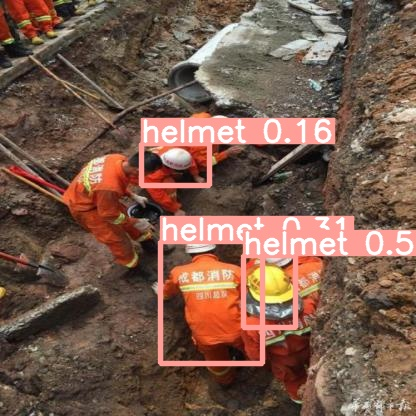

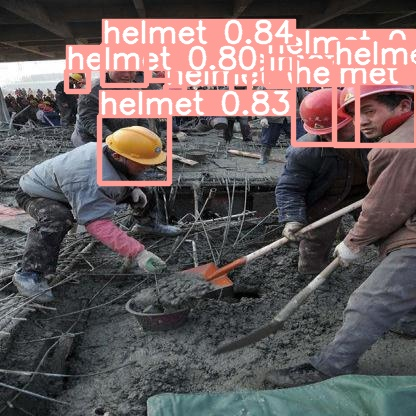

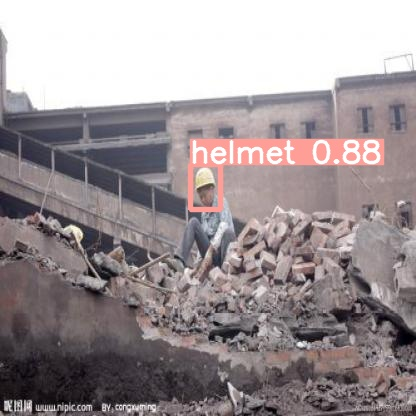

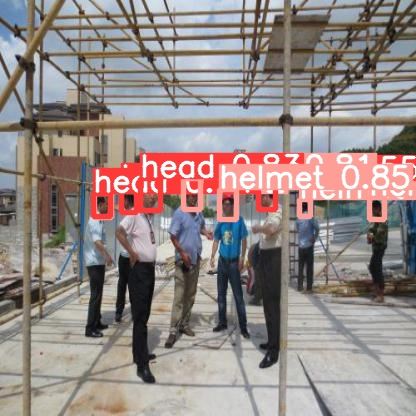

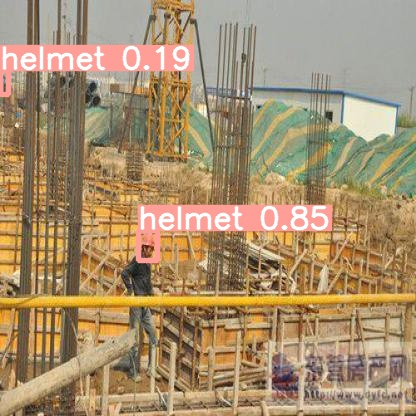

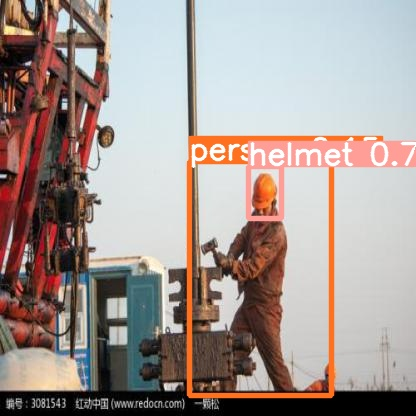

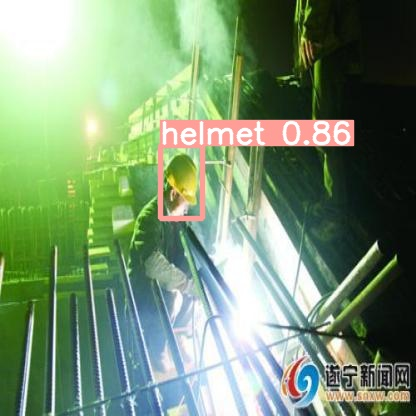

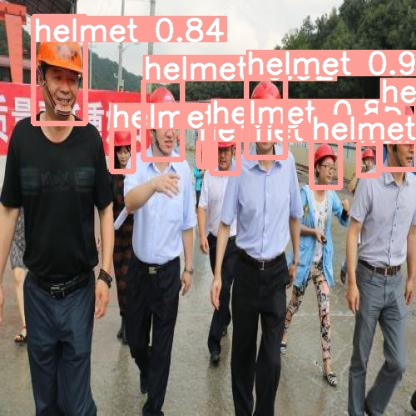

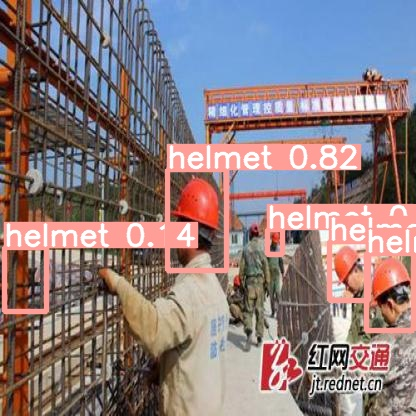

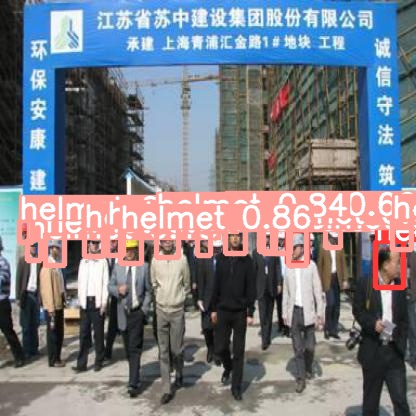

In [20]:
#Visualizamos el resultado de la detección de las piezas de ajedrez

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    # print(imageName)
    display(Image(filename=imageName))
    print("\n")